# 1.PROBLEM DEFINITION

# Question 1.
## Medical Insurance (40 % weight)
Nowadays, medical insurance is becoming a necessity for many people. Depending on the medical care,
insurance companies collect annual premiums. It is difficult to estimate the medical expenses due to various
health conditions of payees. Some conditions are, however, more prevalent for certain segments of the
population. For instance, lung cancer is more likely among smokers than non-smokers, and heart disease may
be more likely among the obese.


As a result, insurers invest a great deal of time and money to develop models that accurately forecast
medical expenses. As a data scientist, you were given some real-life patient data in (insurance.csv) with
the following 7 columns:
    
    
***•age:*** age of primary beneficiary
    
***•sex:*** insurance contractor gender: female or male
        
***•bmi:*** body mass index, providing an understanding of body, weights that are relatively high or low relative to height
    
***•children:*** number of children covered by health insurance
    
***•smoker:*** yes or no
    
***•region:*** the payees' residential area in the US, northeast, southeast, southwest, northwest
    
***•medicalCost:*** individual medical costs billed by medical insurance.
    
    
Your task is to use machine learning to build a prediction model to estimate the medical cost of individuals
based on the predicters given in the dataset. Use the data science methodology to achieve the task. The
following questions need to be answered

## a) Is the required ML supervised, unsupervised, or semi-supervised learning and why? Which ML task (classification, clustering, regression analysis or any other) is the best in this case and why?

## b) Explore your data and document your observation

###  Import libraries used in this project

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns 


%matplotlib inline 

###  Load Data

In [2]:
df = pd.read_csv("insurance.csv") 
df.head()

,age,sex,bmi,children,smoker,region,medicalCost
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


### The top rows

In [3]:
df.head(10)

,age,sex,bmi,children,smoker,region,medicalCost
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
5,31,female,25.740,0,no,southeast,3756.62160
6,46,female,33.440,1,no,southeast,8240.58960
7,37,female,27.740,3,no,northwest,7281.50560
8,37,male,29.830,2,no,northeast,6406.41070
9,60,female,25.840,0,no,northwest,28923.13692


## Bottom rows

In [4]:
df.tail(10)

,age,sex,bmi,children,smoker,region,medicalCost
1328,23,female,24.225,2,no,northeast,22395.74424
1329,52,male,38.600,2,no,southwest,10325.20600
1330,57,female,25.740,2,no,southeast,12629.16560
1331,23,female,33.400,0,no,southwest,10795.93733
1332,52,female,44.700,3,no,southwest,11411.68500
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350
1336,21,female,25.800,0,no,southwest,2007.94500
1337,61,female,29.070,0,yes,northwest,29141.36030


### Names of columns

In [5]:
df.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'medicalCost'], dtype='object')

They are the names of coulmn in our dataset.

### Number of rows and columns

In [6]:
df.shape

(1338, 7)

The data set has 1338 rows and 7 coulumns.

### Data type in our dataset

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          1338 non-null   int64  
 1   sex          1338 non-null   object 
 2   bmi          1338 non-null   float64
 3   children     1338 non-null   int64  
 4   smoker       1338 non-null   object 
 5   region       1338 non-null   object 
 6   medicalCost  1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


Our dataset has interger,float and object columns.

### Summary statistics of numerical columns

In [8]:
df.describe()

,age,bmi,children,medicalCost
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.663397,1.094918,13270.422265
std,14.049960,6.098187,1.205493,12110.011237
min,18.000000,15.960000,0.000000,1121.873900
25%,27.000000,26.296250,0.000000,4740.287150
50%,39.000000,30.400000,1.000000,9382.033000
75%,51.000000,34.693750,2.000000,16639.912515
max,64.000000,53.130000,5.000000,63770.428010


### Check for missing data

In [9]:
df.isnull().sum()

age            0
sex            0
bmi            0
children       0
smoker         0
region         0
medicalCost    0
dtype: int64

The data set has no missing data.

### Data Visualization

In [10]:
#pip install autoviz

In [11]:
### Auto visualization

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
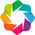

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (1338, 7)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    7 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix data quality issues automatically, import FixDQ from autoviz...
    Alert: Dropping 1 duplicate rows can sometimes cause column data types to change to object. Double-check!


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
age,int64,0.000000,3,18.000000,64.000000,No issue
sex,object,0.000000,0,nan,nan,No issue
bmi,float64,0.000000,NA,15.960000,53.130000,has 9 outliers greater than upper bound (47.32) or lower than lower bound(13.67). Cap them or remove them.
children,int64,0.000000,0,0.000000,5.000000,No issue
smoker,object,0.000000,0,nan,nan,No issue
region,object,0.000000,0,nan,nan,No issue
medicalCost,float64,0.000000,NA,1121.873900,63770.428010,has 139 outliers greater than upper bound (34524.78) or lower than lower bound(-13120.72). Cap them or remove them.


Number of All Scatter Plots = 3


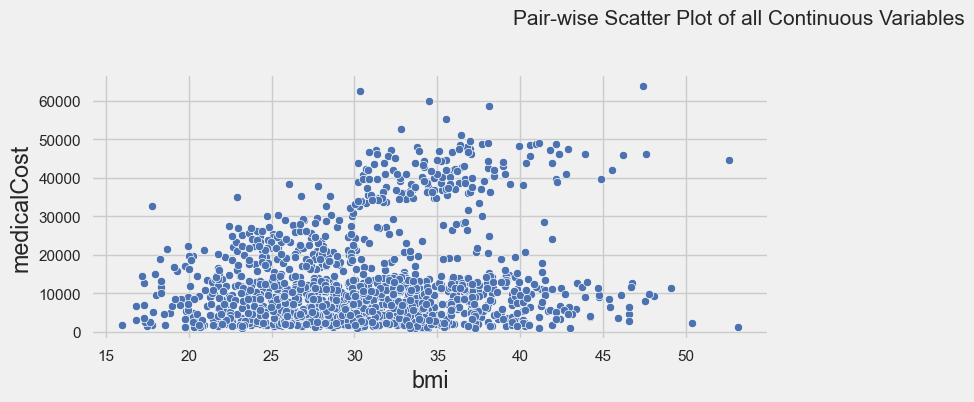

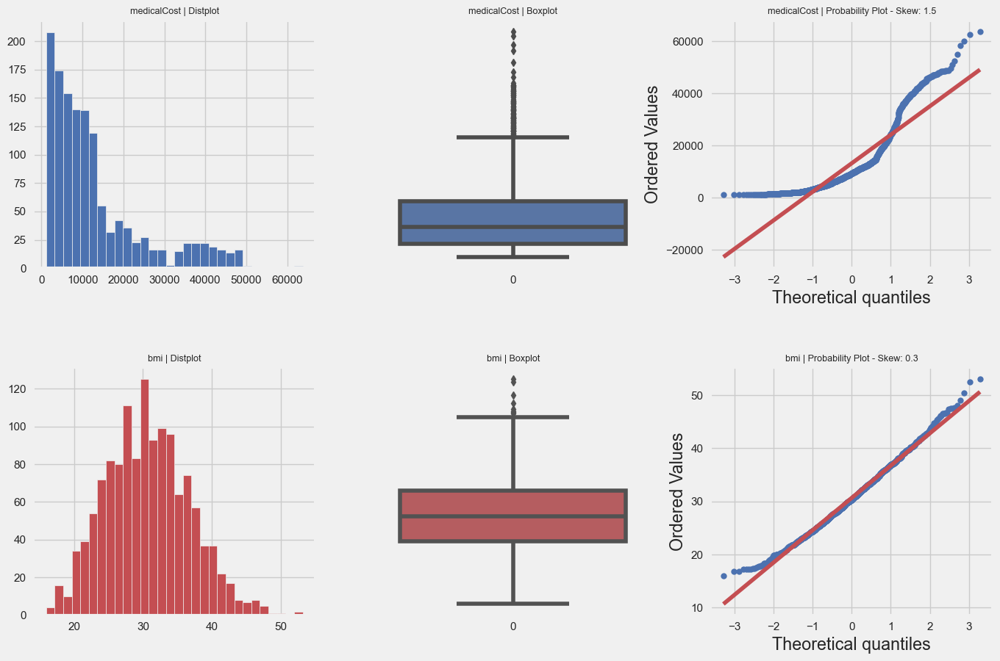

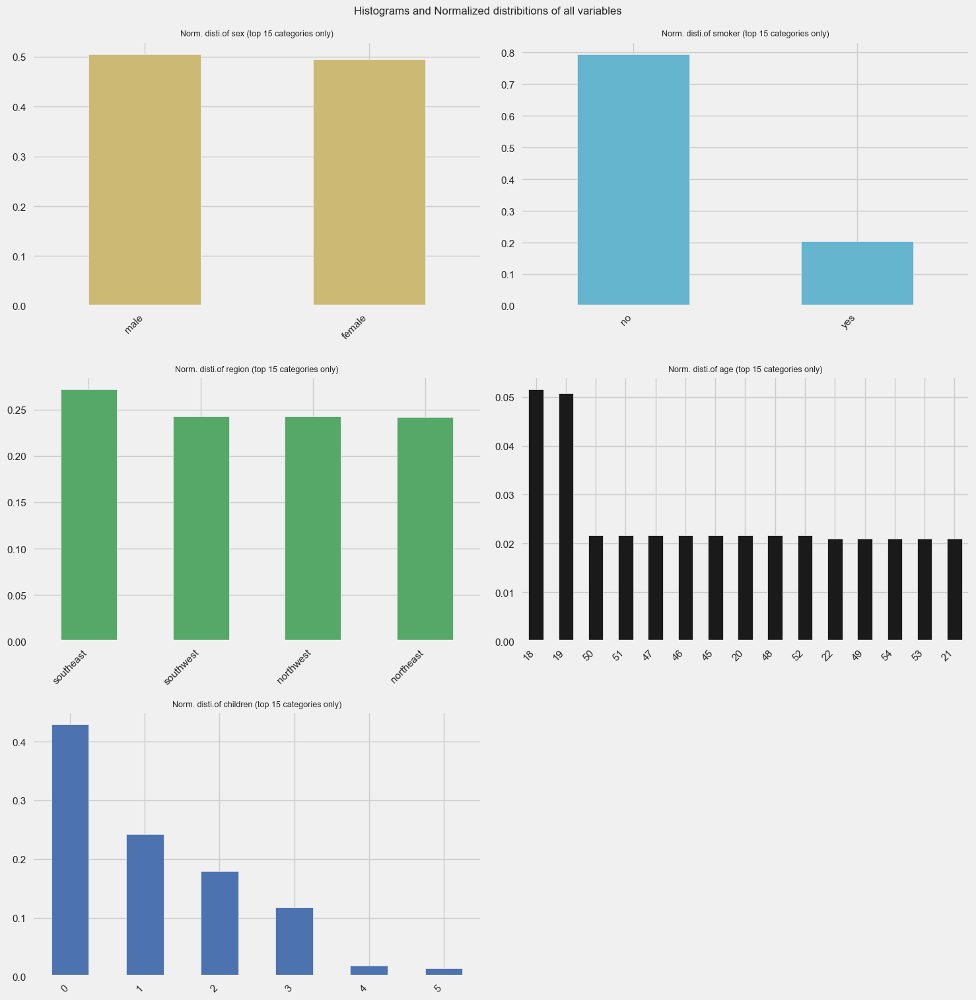

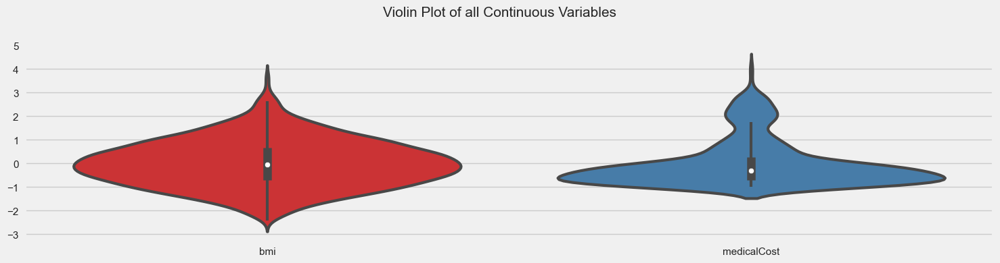

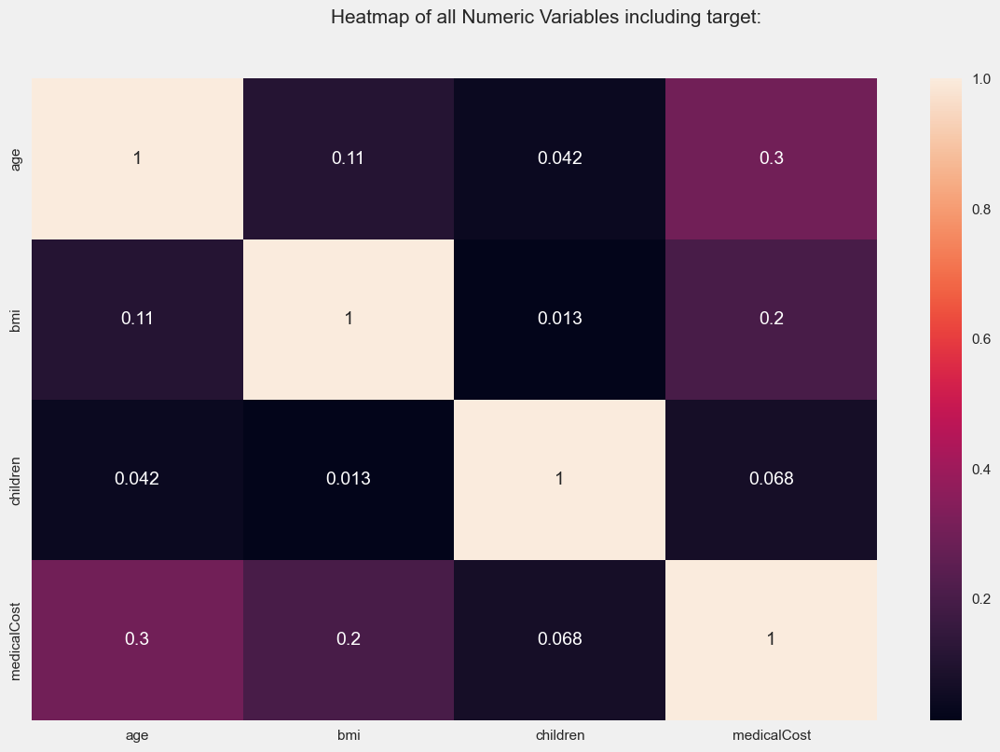

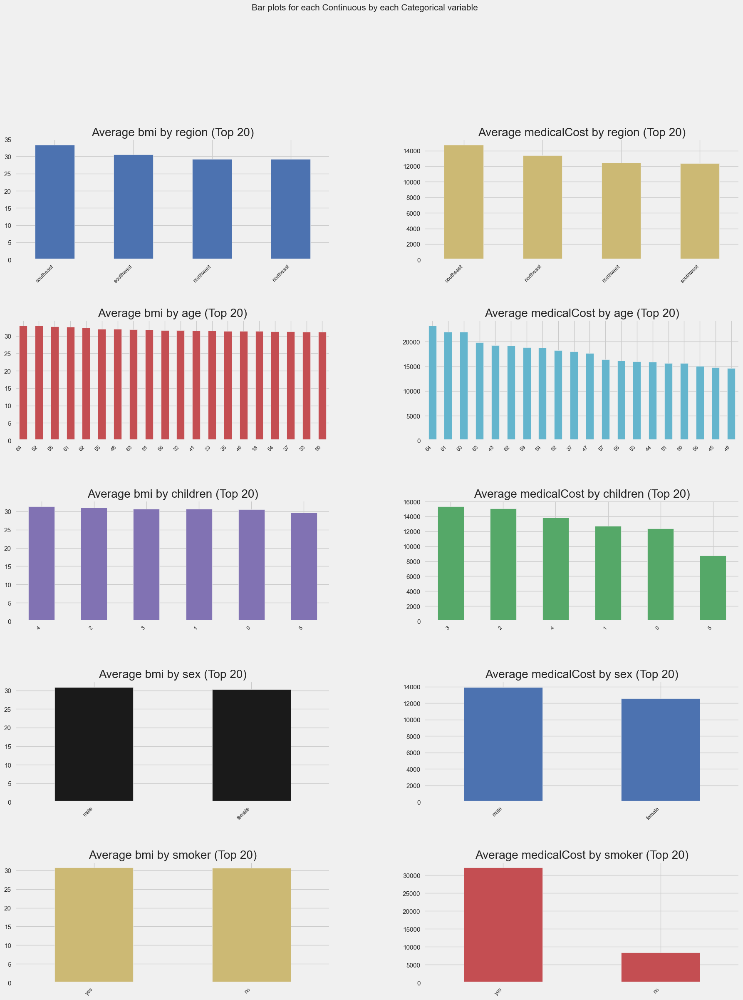

All Plots done
Time to run AutoViz = 12 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [12]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV=AutoViz_Class()
#viz=AV.AutoViz(df)
viz=AV.AutoViz("insurance.csv",sep=",")

## Observation

* The dataset has 1338 rows and 7 coulumns.
* Here are the names of coulumns in our dataset:age, sex, bmi, children, smoker, region and  medicalCost
* The data set did not have any missing values.
* The average age of the individuals in the dataset is 39.2 years old.
* The average BMI is 30.7.
* The average number of children is 1.1.
* The average medical cost is $13,270.42.
* The standard deviation of the medical costs is $12,110. This shows that the dataset contains a wide variety of medical costs.
* The minimum medical cost is $1,121.87, and the maximum medical cost is $63,770.43.
* The 25th percentile medical cost is $4,740.29, the 50th percentile medical cost is $9,382.03, and the 75th percentile medical cost is $16,639.91.
* There is no linear relationship between bmi and medical cost.
* southest region had the most  expensive medical cost.
* The children of the age of 1 had the most number of medical cover. 
* people from southest region had the most  bmi.
* male gender had the most medical cost.

## c) Study the correlation between each predictor and the medical Cost. What is your conclusion?

In [13]:
df.describe(include="object")

,sex,smoker,region
count,1338,1338,1338
unique,2,2,4
top,male,no,southeast
freq,676,1064,364


In [14]:
# Convert object columns to category
df['sex'] = df['sex'].astype('category')
df['smoker'] = df['smoker'].astype('category')
df['region'] = df['region'].astype('category')
df.dtypes

age               int64
sex            category
bmi             float64
children          int64
smoker         category
region         category
medicalCost     float64
dtype: object

In [15]:
##Converting category labels into numerical using LabelEncoder
from sklearn.preprocessing import LabelEncoder
label = LabelEncoder()
label.fit(df.sex.drop_duplicates())
df.sex = label.transform(df.sex)
label.fit(df.smoker.drop_duplicates())
df.smoker = label.transform(df.smoker)
label.fit(df.region.drop_duplicates())
df.region = label.transform(df.region)
df.dtypes

age              int64
sex              int32
bmi            float64
children         int64
smoker           int32
region           int32
medicalCost    float64
dtype: object

In [16]:
# correlation coefficients
correlation = df[['age', 'bmi', 'children','sex','smoker','region','medicalCost']].corr()
correlation

,age,bmi,children,sex,smoker,region,medicalCost
age,1.000000,0.109272,0.042469,-0.020856,-0.025019,0.002127,0.299008
bmi,0.109272,1.000000,0.012759,0.046371,0.003750,0.157566,0.198341
children,0.042469,0.012759,1.000000,0.017163,0.007673,0.016569,0.067998
sex,-0.020856,0.046371,0.017163,1.000000,0.076185,0.004588,0.057292
smoker,-0.025019,0.003750,0.007673,0.076185,1.000000,-0.002181,0.787251
region,0.002127,0.157566,0.016569,0.004588,-0.002181,1.000000,-0.006208
medicalCost,0.299008,0.198341,0.067998,0.057292,0.787251,-0.006208,1.000000


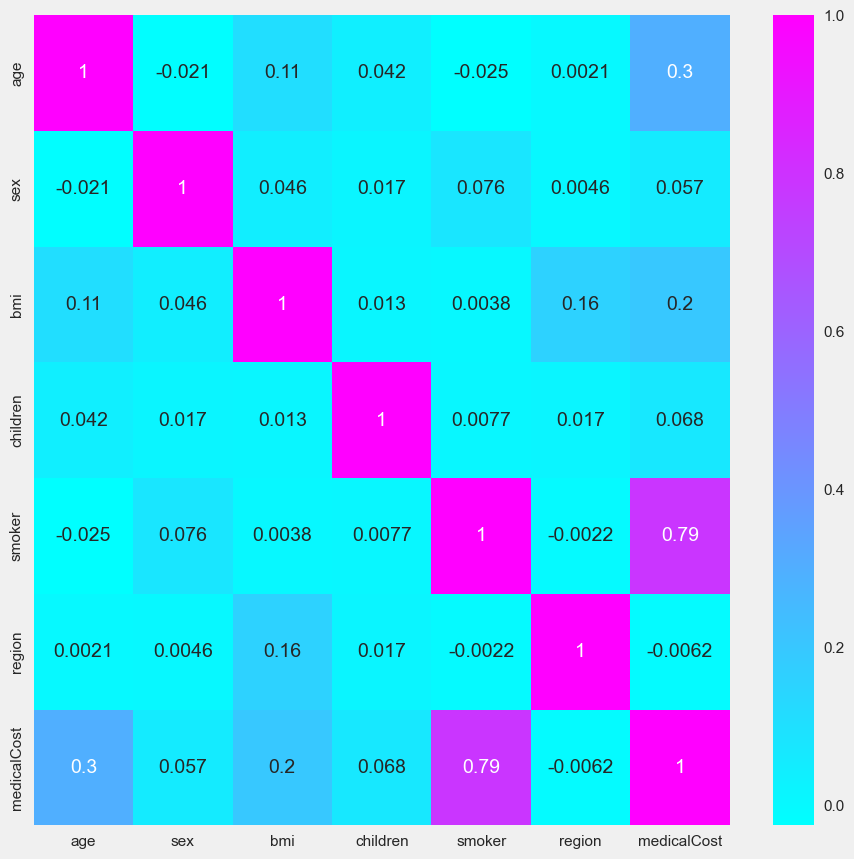

In [17]:
# Heatmap of correlation matrix
f, ax = plt.subplots(1, 1, figsize=(10, 10))
ax = sns.heatmap(df.corr(), annot=True, cmap='cool')

## Conclusion

Several inferences can be taken from the correlation matrix. Age and medical cost have a positive correlation (0.299) showing that as people age  their medical expenses tend to rise.BMI has a relatively positive correlation (0.198) with medical expenditures, implying that higher BMI levels are related with greater medical costs. Furthermore, the number of children has a small positive correlation (0.068) with medical costs, indicating a minimal impact. Furthermore, smoking has a strong positive correlation with medical costs (0.787), meaning that smokers have greater medical expenses in general.The correlation between region and medical cost is negligible (-0.006), implying that area has little influence on medical expenses. In conclusion, age, BMI, smoking status and the number of children all have a correlate with medical costs with smoking status having the largest correlation.

## d) Use the correlation analysis to select the 3 best predictors and build a simple linear regression model based on each of the predictors

In [18]:
df.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'medicalCost'], dtype='object')

In [19]:
best = {'age','bmi','smoker'}
best

{'age', 'bmi', 'smoker'}

In [20]:
import statsmodels.api as sm

# Define the predictors and target variable
pred = ['age', 'bmi', 'smoker']
target = 'medicalCost'

# Adding constant to predictors
X = sm.add_constant(df[pred])
y = df[target]

# Fit the ordinary least squares (OLS) model
model = sm.OLS(y, X).fit()

# Print the summary statistics
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            medicalCost   R-squared:                       0.747
Model:                            OLS   Adj. R-squared:                  0.747
Method:                 Least Squares   F-statistic:                     1316.
Date:                Thu, 20 Jul 2023   Prob (F-statistic):               0.00
Time:                        12:38:05   Log-Likelihood:                -13557.
No. Observations:                1338   AIC:                         2.712e+04
Df Residuals:                    1334   BIC:                         2.714e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.168e+04    937.569    -12.454      0.0

## e) Evaluate the performance with the statistical performance measures to evaluate the statistical significance of your results.

* The model has an R-squared value of 0.747, which means that 74.7% of the variation in medicalCost can be explained by the three independent variables (age, bmi, and smoker).
* The coefficient for the constant term is -116,800, which means that the predicted medicalCost for a person with age = 0, bmi = 0, and smoker = 0 is -116,800.
* The coefficient for age is 259, which means that for every one year increase in age, the predicted medicalCost increases by 259.
* The coefficient for bmi is 322, which means that for every one unit increase in bmi, the predicted medicalCost increases by 322.
* The coefficient for smoker is 23,820, which means that smokers have a predicted medicalCost that is 23,820 higher than non-smokers.
* The Durbin-Watson statistic is 2.077, which suggests that there is no autocorrelation in the residuals.
* The Jarque-Bera statistic is 710.137, which is highly significant, suggesting that the residuals are not normally distributed.
* The condition number is 289, which is large, suggesting that the model may be sensitive to changes in the independent variables.

## f) Build two multivariate regression models 1) with the three predictors above and 2) with all the predictors in the dataset. Evaluate and compare the two models.

### 1) with the three predictors above

In [21]:
model_1 = sm.OLS(y, sm.add_constant(df[['age', 'bmi', 'smoker']])).fit()
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            medicalCost   R-squared:                       0.747
Model:                            OLS   Adj. R-squared:                  0.747
Method:                 Least Squares   F-statistic:                     1316.
Date:                Thu, 20 Jul 2023   Prob (F-statistic):               0.00
Time:                        12:38:05   Log-Likelihood:                -13557.
No. Observations:                1338   AIC:                         2.712e+04
Df Residuals:                    1334   BIC:                         2.714e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.168e+04    937.569    -12.454      0.000   -1.35e+04   -9837.561
age          259.5475     11.934     21.748      0.000     236.136     282.959
bmi          322.6151     27.487     11.737      0.000     268.692     376.538
smoker      2.382e+04    412.867     57.703      0.000     2.3e+04    2.46e+04
==============================================================================
Omnibus:                      299.709   Durbin-Watson:                   2.077
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              710.137
Skew:                           1.213   Prob(JB):                    6.25e-155
Kurtosis:                       5.618   Cond. No.                         289.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## 2) with all the predictors in the dataset

In [22]:
model_2 = sm.OLS(y, sm.add_constant(df.drop(columns=[target]))).fit()
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            medicalCost   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.750
Method:                 Least Squares   F-statistic:                     668.1
Date:                Thu, 20 Jul 2023   Prob (F-statistic):               0.00
Time:                        12:38:06   Log-Likelihood:                -13548.
No. Observations:                1338   AIC:                         2.711e+04
Df Residuals:                    1331   BIC:                         2.715e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.182e+04    955.130    -12.371      0.000   -1.37e+04   -9941.729
age          257.2881     11.886     21.647      0.000     233.971     280.605
sex         -131.1106    332.811     -0.394      0.694    -784.001     521.780
bmi          332.5701     27.722     11.997      0.000     278.186     386.954
children     479.3694    137.644      3.483      0.001     209.346     749.393
smoker      2.382e+04    411.843     57.839      0.000     2.3e+04    2.46e+04
region      -353.6400    151.927     -2.328      0.020    -651.682     -55.598
==============================================================================
Omnibus:                      299.003   Durbin-Watson:                   2.088
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              713.975
Skew:                           1.207   Prob(JB):                    9.17e-156
Kurtosis:                       5.642   Cond. No.                         296.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## g) State your overall conclusions for this task.

In conclusion, age, BMI, smoking status and the number of children have much impact to the medical cost.

# Question 2.
## Census Income (60 % weight)
In this exercise, we use the US Census dataset from the Census bureau (publicly available from UCI Machine
Learning Repository). The task is to predict whether a given adult makes more than
$50,000 a year or not based on a number of attributes. The dataset has 14 column names as below:
    
***•age:*** the age of an individual
    
***•workclass:*** employment status of an individual
    
***•fnlwgt:*** final weight. In other words, this is the number of people the census believes the entry represents
    
***•education:*** the highest level of education achieved by an individual
    
***•education-num:*** the highest level of education achieved in numerical form
    
***•marital-status:*** marital status of an individual.
    
***•occupation:*** the general type of occupation of an individual
    
***•relationship:*** represents what this individual is relative to others •
    
***•sex:*** the biological sex of the individual
    
***•capital-gain:*** capital gains for an individual
    
***•capital-loss:*** capital loss for an individual
    
***•hours-per-week:*** the hours an individual has reported to work per week
    
***•native-country:*** country of origin for an individual
    
***•label:*** whether or not an individual makes more than $50,000 annually.
    
    
Your task is to use machine learning to build a machine learning (ML) models. You can apply some assumptions if necessary, but you need to explain what assumptions and why you applied in your ML model?Again, use the data science methodology to achieve the task. The following questions need to be answered.

## a) Load and explore the data (note your observations).

In [23]:
## load dataset
data = pd.read_csv("CensusDB.csv")
data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,Female,0,3900,40,United-States,<=50K


### Top 10 rows

In [24]:
data.head(10)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,Female,0,3900,40,United-States,<=50K
5,34,Private,216864,HS-grad,9,Divorced,Other-service,Unmarried,Female,0,3770,45,United-States,<=50K
6,38,Private,150601,10th,6,Separated,Adm-clerical,Unmarried,Male,0,3770,40,United-States,<=50K
7,74,State-gov,88638,Doctorate,16,Never-married,Prof-specialty,Other-relative,Female,0,3683,20,United-States,>50K
8,68,Federal-gov,422013,HS-grad,9,Divorced,Prof-specialty,Not-in-family,Female,0,3683,40,United-States,<=50K
9,41,Private,70037,Some-college,10,Never-married,Craft-repair,Unmarried,Male,0,3004,60,?,>50K


### Bottom 10 rows

In [25]:
data.tail(10)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,sex,capital-gain,capital-loss,hours-per-week,native-country,income
32551,43,Self-emp-not-inc,27242,Some-college,10,Married-civ-spouse,Craft-repair,Husband,Male,0,0,50,United-States,<=50K
32552,32,Private,34066,10th,6,Married-civ-spouse,Handlers-cleaners,Husband,Male,0,0,40,United-States,<=50K
32553,43,Private,84661,Assoc-voc,11,Married-civ-spouse,Sales,Husband,Male,0,0,45,United-States,<=50K
32554,32,Private,116138,Masters,14,Never-married,Tech-support,Not-in-family,Male,0,0,11,Taiwan,<=50K
32555,53,Private,321865,Masters,14,Married-civ-spouse,Exec-managerial,Husband,Male,0,0,40,United-States,>50K
32556,22,Private,310152,Some-college,10,Never-married,Protective-serv,Not-in-family,Male,0,0,40,United-States,<=50K
32557,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,Female,0,0,38,United-States,<=50K
32558,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,Male,0,0,40,United-States,>50K
32559,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,Female,0,0,40,United-States,<=50K
32560,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,Male,0,0,20,United-States,<=50K


### Rows and columns

In [26]:
data.shape

(32561, 14)

### Names of columns

In [27]:
data.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'sex', 'capital-gain',
       'capital-loss', 'hours-per-week', 'native-country', 'income'],
      dtype='object')

### Overview of the dataset

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education-num   32561 non-null  int64 
 5   marital-status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   sex             32561 non-null  object
 9   capital-gain    32561 non-null  int64 
 10  capital-loss    32561 non-null  int64 
 11  hours-per-week  32561 non-null  int64 
 12  native-country  32561 non-null  object
 13  income          32561 non-null  object
dtypes: int64(6), object(8)
memory usage: 3.5+ MB


### Statistical summary

In [29]:
data.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [30]:
data.describe(include="object")

,workclass,education,marital-status,occupation,relationship,sex,native-country,income
count,32561,32561,32561,32561,32561,32561,32561,32561
unique,9,16,7,15,6,2,42,2
top,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,Male,United-States,<=50K
freq,22696,10501,14976,4140,13193,21790,29170,24720


### Check missing values

In [31]:
data.isnull().sum()

age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
native-country    0
income            0
dtype: int64

### Auto visualization 

Shape of your Data Set loaded: (32561, 14)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    14 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix data quality issues automatically, import FixDQ from autoviz...
    Alert: Dropping 24 duplicate rows can sometimes cause column data types to change to object. Double-check!


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
age,int64,0.000000,0,17.000000,90.000000,has 142 outliers greater than upper bound (78.00) or lower than lower bound(-2.00). Cap them or remove them.
workclass,object,0.000000,0,nan,nan,"2 rare categories: ['Without-pay', 'Never-worked']. Group them into a single category or drop the categories."
fnlwgt,int64,0.000000,66,12285.000000,1484705.000000,has 993 outliers greater than upper bound (415742.00) or lower than lower bound(-60922.00). Cap them or remove them.
education,object,0.000000,0,nan,nan,"2 rare categories: ['1st-4th', 'Preschool']. Group them into a single category or drop the categories."
education-num,int64,0.000000,0,1.000000,16.000000,has 1193 outliers greater than upper bound (16.50) or lower than lower bound(4.50). Cap them or remove them.
marital-status,object,0.000000,0,nan,nan,1 rare categories: ['Married-AF-spouse']. Group them into a single category or drop the categories.
occupation,object,0.000000,0,nan,nan,"2 rare categories: ['Priv-house-serv', 'Armed-Forces']. Group them into a single category or drop the categories."
relationship,object,0.000000,0,nan,nan,No issue
sex,object,0.000000,0,nan,nan,No issue
capital-gain,int64,0.000000,0,0.000000,99999.000000,has 2712 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.


Number of All Scatter Plots = 21


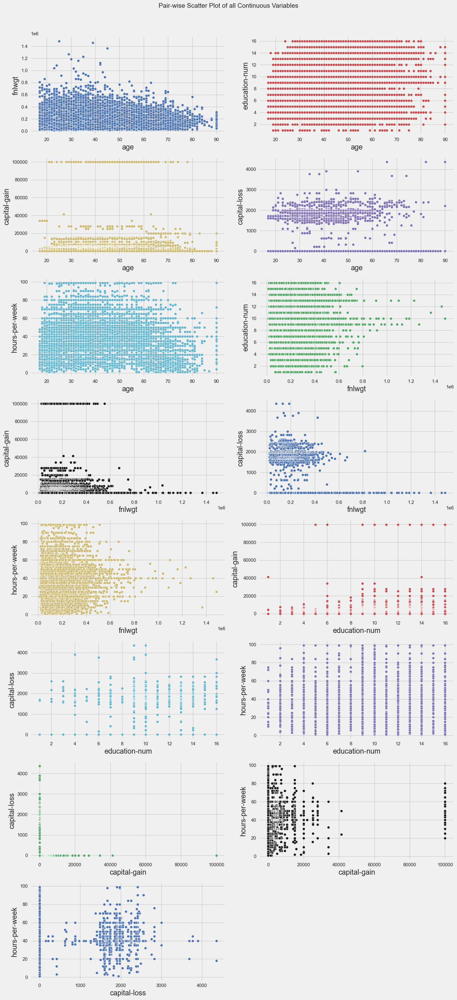

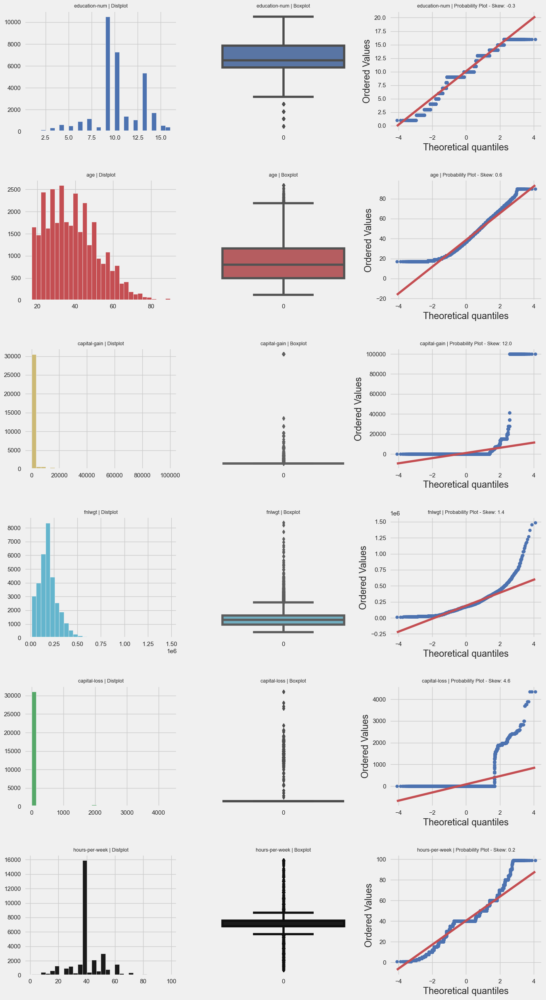

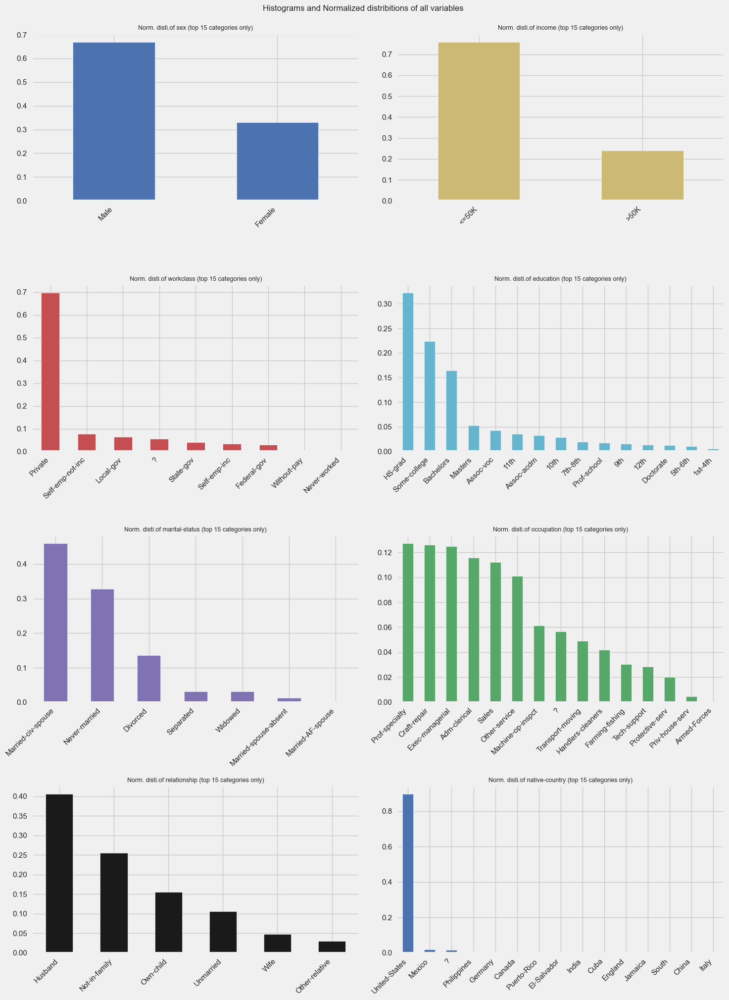

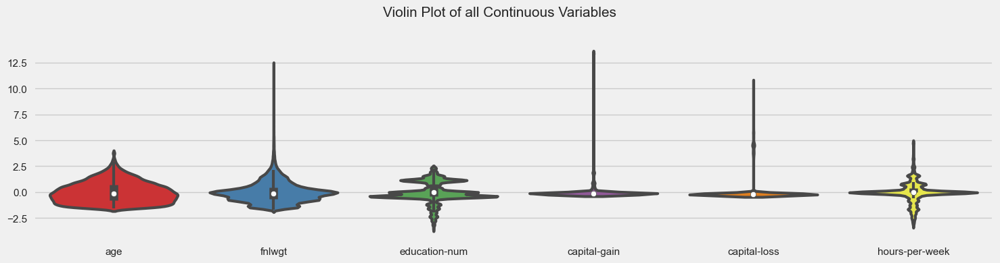

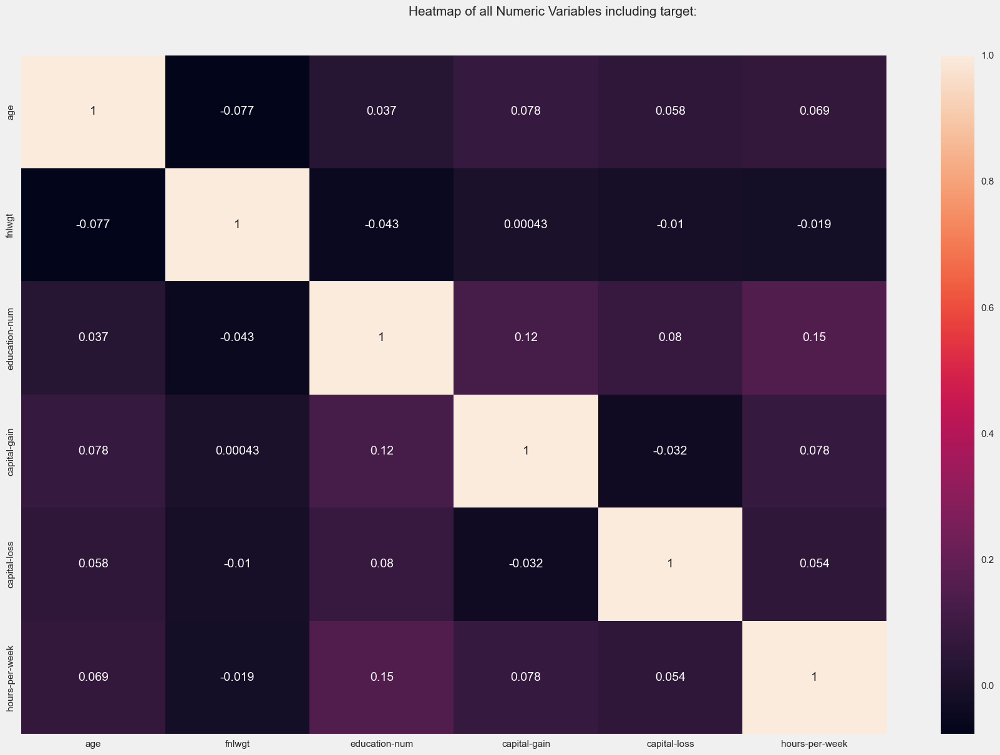

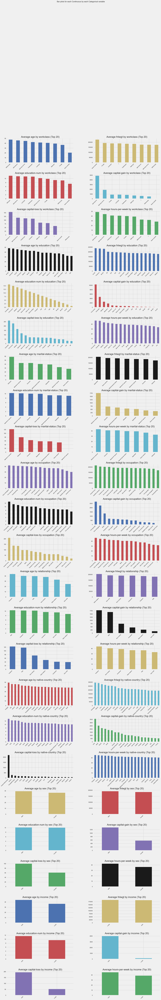

All Plots done
Time to run AutoViz = 41 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [32]:
AV=AutoViz_Class()
viz=AV.AutoViz("CensusDB.csv",sep=",")

### Observations

* The dataset has no missing data and has 14 columns and 32561 rows.
* The most frequent workclass is Private, with 22,696 observations.
* The most frequent education level is HS-grad, with 10,501 observations.
* The most frequent marital status is Married-civ-spouse, with 14,976 observations.
* The most frequent occupation is Prof-specialty, with 4,140 observations.
* The most frequent relationship is Husband, with 13,193 observations.
* The most frequent sex is Male, with 21,790 observations.
* The most frequent native country is United-States, with 29,170 observations.
* The most frequent income category is <=50K, with 24,720 observations.

### b) Use appropriate methods to handle categorical data

In [33]:
data.T.head(14)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,...,32311,32312,32313,32314,32315,32316,32317,32318,32319,32320,32321,32322,32323,32324,32325,32326,32327,32328,32329,32330,32331,32332,32333,32334,32335,32336,32337,32338,32339,32340,32341,32342,32343,32344,32345,32346,32347,32348,32349,32350,32351,32352,32353,32354,32355,32356,32357,32358,32359,32360,32361,32362,32363,32364,32365,32366,32367,32368,32369,32370,32371,32372,32373,32374,32375,32376,32377,32378,32379,32380,32381,32382,32383,32384,32385,32386,32387,32388,32389,32390,32391,32392,32393,32394,32395,32396,32397,32398,32399,32400,32401,32402,32403,32404,32405,32406,32407,32408,32409,32410,32411,32412,32413,32414,32415,32416,32417,32418,32419,32420,32421,32422,32423,32424,32425,32426,32427,32428,32429,32430,32431,32432,32433,32434,32435,32436,32437,32438,32439,32440,32441,32442,32443,32444,32445,32446,32447,32448,32449,32450,32451,32452,32453,32454,32455,32456,32457,32458,32459,32460,32461,32462,32463,32464,32465,32466,32467,32468,32469,32470,32471,32472,32473,32474,32475,32476,32477,32478,32479,32480,32481,32482,32483,32484,32485,32486,32487,32488,32489,32490,32491,32492,32493,32494,32495,32496,32497,32498,32499,32500,32501,32502,32503,32504,32505,32506,32507,32508,32509,32510,32511,32512,32513,32514,32515,32516,32517,32518,32519,32520,32521,32522,32523,32524,32525,32526,32527,32528,32529,32530,32531,32532,32533,32534,32535,32536,32537,32538,32539,32540,32541,32542,32543,32544,32545,32546,32547,32548,32549,32550,32551,32552,32553,32554,32555,32556,32557,32558,32559,32560
age,90,82,66,54,41,34,38,74,68,41,45,38,52,32,51,46,45,57,22,34,37,29,61,51,61,21,33,49,37,38,23,59,52,51,60,63,53,51,37,54,44,43,51,43,71,48,71,73,68,67,40,50,51,42,39,32,53,40,38,33,43,50,44,51,41,60,37,55,39,42,49,47,41,55,39,42,41,46,40,32,41,60,31,58,37,44,39,43,55,44,39,46,39,62,31,46,46,39,39,59,50,46,53,50,41,36,38,54,50,47,47,67,67,72,72,46,78,71,83,68,26,68,49,36,70,27,35,23,81,66,71,68,68,65,52,40,68,21,35,70,61,65,46,26,59,61,60,49,34,25,55,59,28,43,56,41,42,28,40,69,66,69,55,57,20,33,30,40,38,46,29,57,39,47,26,27,23,34,33,38,57,36,44,49,44,55,45,48,31,55,70,70,73,72,31,28,23,49,27,90,68,65,65,67,66,24,44,35,20,38,39,32,42,63,42,64,28,41,41,58,59,34,45,29,47,40,47,63,41,34,66,65,70,75,65,65,73,60,68,74,43,19,37,45,64,30,51,35,29,34,...,54,26,44,28,54,21,24,31,59,41,29,50,32,42,47,44,49,61,45,59,30,34,24,36,21,34,41,18,26,23,63,34,54,37,54,22,32,42,31,48,28,31,28,24,50,26,37,24,18,32,23,33,49,75,26,66,34,18,33,36,44,36,53,60,28,36,45,23,35,34,46,58,55,63,41,45,42,41,22,49,51,22,23,59,40,28,39,25,48,62,44,28,62,32,59,20,47,60,55,18,31,22,56,41,24,52,42,48,35,33,20,33,30,31,29,26,61,45,29,57,20,26,36,23,31,47,61,35,23,20,41,39,51,61,51,36,41,25,37,19,66,23,30,25,51,53,17,61,44,38,40,32,46,50,36,30,33,85,62,24,58,45,66,55,39,58,50,28,34,36,22,35,49,21,64,41,52,32,27,48,28,24,51,32,61,60,33,42,24,82,26,18,34,57,25,71,35,47,50,33,38,50,45,32,39,25,20,46,40,30,36,46,27,33,58,30,26,81,32,22,31,29,35,30,34,54,37,22,34,30,71,45,41,72,45,31,39,37,43,43,43,32,43,32,53,22,27,40,58,22
workclass,?,Private,?,Private,Private,Private,Private,State-gov,Federal-gov,Private,Private,Self-

data preparation:

    1.Replace "?" with mode
    
    2.convert object to categorical data type
    
    3.convert  income into binary data type(converts the "income" column to binary data type by comparing it to the ">50K" value and converting the result to an integer (1 for True, 0 for False))

In [34]:
# 1. Replace "?" with mode
data = data.replace('?', data.mode().iloc[0])

# 2. Convert object columns to categorical data type
categorical_columns = ['workclass', 'education', 'marital-status', 'occupation',
                       'relationship', 'sex', 'native-country', 'income']
data[categorical_columns] = data[categorical_columns].astype('category')

# 3. Convert income to binary data type
data['income'] = [1 if i == '>50K' else 0 for i in data['income']]

# Print the updated dataset
data.T.head(14)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,...,32311,32312,32313,32314,32315,32316,32317,32318,32319,32320,32321,32322,32323,32324,32325,32326,32327,32328,32329,32330,32331,32332,32333,32334,32335,32336,32337,32338,32339,32340,32341,32342,32343,32344,32345,32346,32347,32348,32349,32350,32351,32352,32353,32354,32355,32356,32357,32358,32359,32360,32361,32362,32363,32364,32365,32366,32367,32368,32369,32370,32371,32372,32373,32374,32375,32376,32377,32378,32379,32380,32381,32382,32383,32384,32385,32386,32387,32388,32389,32390,32391,32392,32393,32394,32395,32396,32397,32398,32399,32400,32401,32402,32403,32404,32405,32406,32407,32408,32409,32410,32411,32412,32413,32414,32415,32416,32417,32418,32419,32420,32421,32422,32423,32424,32425,32426,32427,32428,32429,32430,32431,32432,32433,32434,32435,32436,32437,32438,32439,32440,32441,32442,32443,32444,32445,32446,32447,32448,32449,32450,32451,32452,32453,32454,32455,32456,32457,32458,32459,32460,32461,32462,32463,32464,32465,32466,32467,32468,32469,32470,32471,32472,32473,32474,32475,32476,32477,32478,32479,32480,32481,32482,32483,32484,32485,32486,32487,32488,32489,32490,32491,32492,32493,32494,32495,32496,32497,32498,32499,32500,32501,32502,32503,32504,32505,32506,32507,32508,32509,32510,32511,32512,32513,32514,32515,32516,32517,32518,32519,32520,32521,32522,32523,32524,32525,32526,32527,32528,32529,32530,32531,32532,32533,32534,32535,32536,32537,32538,32539,32540,32541,32542,32543,32544,32545,32546,32547,32548,32549,32550,32551,32552,32553,32554,32555,32556,32557,32558,32559,32560
age,90,82,66,54,41,34,38,74,68,41,45,38,52,32,51,46,45,57,22,34,37,29,61,51,61,21,33,49,37,38,23,59,52,51,60,63,53,51,37,54,44,43,51,43,71,48,71,73,68,67,40,50,51,42,39,32,53,40,38,33,43,50,44,51,41,60,37,55,39,42,49,47,41,55,39,42,41,46,40,32,41,60,31,58,37,44,39,43,55,44,39,46,39,62,31,46,46,39,39,59,50,46,53,50,41,36,38,54,50,47,47,67,67,72,72,46,78,71,83,68,26,68,49,36,70,27,35,23,81,66,71,68,68,65,52,40,68,21,35,70,61,65,46,26,59,61,60,49,34,25,55,59,28,43,56,41,42,28,40,69,66,69,55,57,20,33,30,40,38,46,29,57,39,47,26,27,23,34,33,38,57,36,44,49,44,55,45,48,31,55,70,70,73,72,31,28,23,49,27,90,68,65,65,67,66,24,44,35,20,38,39,32,42,63,42,64,28,41,41,58,59,34,45,29,47,40,47,63,41,34,66,65,70,75,65,65,73,60,68,74,43,19,37,45,64,30,51,35,29,34,...,54,26,44,28,54,21,24,31,59,41,29,50,32,42,47,44,49,61,45,59,30,34,24,36,21,34,41,18,26,23,63,34,54,37,54,22,32,42,31,48,28,31,28,24,50,26,37,24,18,32,23,33,49,75,26,66,34,18,33,36,44,36,53,60,28,36,45,23,35,34,46,58,55,63,41,45,42,41,22,49,51,22,23,59,40,28,39,25,48,62,44,28,62,32,59,20,47,60,55,18,31,22,56,41,24,52,42,48,35,33,20,33,30,31,29,26,61,45,29,57,20,26,36,23,31,47,61,35,23,20,41,39,51,61,51,36,41,25,37,19,66,23,30,25,51,53,17,61,44,38,40,32,46,50,36,30,33,85,62,24,58,45,66,55,39,58,50,28,34,36,22,35,49,21,64,41,52,32,27,48,28,24,51,32,61,60,33,42,24,82,26,18,34,57,25,71,35,47,50,33,38,50,45,32,39,25,20,46,40,30,36,46,27,33,58,30,26,81,32,22,31,29,35,30,34,54,37,22,34,30,71,45,41,72,45,31,39,37,43,43,43,32,43,32,53,22,27,40,58,22
workclass,Private,Private,Private,Private,Private,Private,Private,State-gov,Federal-gov,Private,P

In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             32561 non-null  int64   
 1   workclass       32561 non-null  category
 2   fnlwgt          32561 non-null  int64   
 3   education       32561 non-null  category
 4   education-num   32561 non-null  int64   
 5   marital-status  32561 non-null  category
 6   occupation      32561 non-null  category
 7   relationship    32561 non-null  category
 8   sex             32561 non-null  category
 9   capital-gain    32561 non-null  int64   
 10  capital-loss    32561 non-null  int64   
 11  hours-per-week  32561 non-null  int64   
 12  native-country  32561 non-null  category
 13  income          32561 non-null  int64   
dtypes: category(7), int64(7)
memory usage: 2.0 MB


## c) Investigate and train at least 5 ML models including Classification (to predict if an individual going to earn more $50,000 annually or not), Clustering and Neural Networks. You are free to choose any ML algorithms.

## Clustering

### K-means Clustering

In [36]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans

# Split the data into features and target variable
X = data.drop('income', axis=1)
y = data['income']

# Split the data into training and testing sets
y.value_counts()

0    24720
1     7841
Name: income, dtype: int64

In [37]:
X.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,sex,capital-gain,capital-loss,hours-per-week,native-country
0,90,Private,77053,HS-grad,9,Widowed,Prof-specialty,Not-in-family,Female,0,4356,40,United-States
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,Female,0,4356,18,United-States
2,66,Private,186061,Some-college,10,Widowed,Prof-specialty,Unmarried,Female,0,4356,40,United-States
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,Female,0,3900,40,United-States
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,Female,0,3900,40,United-States


In [38]:
cols = ['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'sex', 'native-country']

X = pd.get_dummies(X, columns=cols)

In [39]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [40]:
# Create the K-means Clustering model
from sklearn.metrics import silhouette_score
kmeans = KMeans(n_clusters=2, random_state=42)

# Fit the model on the data
kmeans.fit(X)

# Get the predicted labels
labels = kmeans.labels_

# Evaluate the model (if ground truth labels are available)
silhouette_score = silhouette_score(X, labels)
silhouette_score

0.5857680110016187

## Neural Networks

### Multi-Layer Perceptron (MLP) Classifier

In [41]:
from sklearn.neural_network import MLPClassifier

# Create and train the MLP Classifier
mlp_classifier = MLPClassifier(hidden_layer_sizes=(100, 50), random_state=42)
mlp_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = mlp_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.797328420082911

## classification models

### 1.Decision Tree Classifier

In [42]:
from sklearn.tree import DecisionTreeClassifier


# Create and train the Decision Tree Classifier
dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = dt_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.81759557807462

### 2.Random Forest Classifier

In [43]:
from sklearn.ensemble import RandomForestClassifier

# Create and train the Random Forest Classifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.8492246276677414

### 3.SVM classifier

In [44]:
from sklearn.svm import SVC

# Create and train the SVM classifier
svm_classifier = SVC()
svm_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = svm_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.7959465684016582

## d) Optimise your models, evaluate the models and compare the models’ results as:i. How optimisation improve the performance of the model? Which parameter you used for optimisation.ii. Compare the results among the models of similar types (eg. If you using two classification models,compare their performances)

### i. How optimisation improve the performance of the model? Which parameter you used for optimisation

### Decision Tree Classifier

In [47]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters to tune
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Create the grid search object
grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5)

# Fit the grid search object to the data
grid_search.fit(X_train, y_train)

# Get the best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Evaluate the best model
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Optimized Decision Tree Classifier Accuracy:", accuracy)
print("Best Parameters:", best_params)

Optimized Decision Tree Classifier Accuracy: 0.8519883310302472
Best Parameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2}


### Random Forest Classifier

In [48]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
import numpy as np

# Define the hyperparameters to tune
param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False]
}

# Create the randomized search object
random_search = RandomizedSearchCV(RandomForestClassifier(), param_grid, n_iter=10, cv=5)

# Fit the randomized search object to the data
random_search.fit(X_train, y_train)

# Get the best parameters and model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

# Evaluate the best model
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Optimized Random Forest Classifier Accuracy:", accuracy)
print("Best Parameters:", best_params)

Optimized Random Forest Classifier Accuracy: 0.8630431444802702
Best Parameters: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 15, 'bootstrap': True}


### K-means Clustering

In [49]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Create the K-means Clustering model
kmeans = KMeans(n_clusters=2, random_state=42)

# Fit the model on the data
kmeans.fit(X)

# Get the predicted labels
labels = kmeans.labels_

# Evaluate the model
silhouette_score = silhouette_score(X, labels)
print("K-means Clustering Silhouette Score:", silhouette_score)

K-means Clustering Silhouette Score: 0.5857680110016187


### Multi-Layer Perceptron (MLP) Classifier

In [50]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import reciprocal

# Define the hyperparameters to tune
param_grid = {
    'hidden_layer_sizes': [(50,), (100,)],
    'activation': ['relu', 'tanh'],
    'alpha': reciprocal(0.001, 0.1),
    'learning_rate': ['constant', 'adaptive']
}

# Create the randomized search object
random_search = RandomizedSearchCV(MLPClassifier(max_iter=1000), param_grid, n_iter=10, cv=5)

# Fit the randomized search object to the data
random_search.fit(X_train, y_train)

# Get the best parameters and model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

# Evaluate the best model
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Optimized MLP Classifier Accuracy:", accuracy)
print("Best Parameters:", best_params)

Optimized MLP Classifier Accuracy: 0.7721480116689697
Best Parameters: {'activation': 'tanh', 'alpha': 0.011406048378328986, 'hidden_layer_sizes': (100,), 'learning_rate': 'adaptive'}


### ii. Compare the results among the models of similar types (eg. If you using two classification models,compare their performances)

a) Decision Tree Classifier and Random Forest Classifier:

   - Baseline predictions:
   
     - Decision Tree Classifier: Accuracy = 0.8176
     
     - Random Forest Classifier: Accuracy = 0.8492
     
   - After improving the performance of the model:
   
     - Decision Tree Classifier: Accuracy = 0.8520
     
     - Random Forest Classifier: Accuracy = 0.8630
     
   - Comparison: After hyperparameter tuning both models (Decision Tree and Random Forest) have shown an improvement in               accuracy. The Random Forest Classifier consistently outperforms the Decision Tree Classifier both before and after               hyperparameter tuning.

b) SVM Classifier and Multi-Layer Perceptron (MLP) Classifier:

   - Baseline predictions
   
     - SVM Classifier: Accuracy = 0.7959
     
     - MLP Classifier: Accuracy = 0.7973
     
   - After improving the performance of the model:
   
     - MLP Classifier: Accuracy = 0.7721
     
   - Comparison: Before hyperparameter tuning the MLP Classifier had a slightly higher accuracy than the SVM Classifier.

c) K-means Clustering:

   - Baseline predictions: Accuracy = 0.5858
   
   - After improving the performance of the model: Accuracy = 0.5858
   
   - Comparison: The accuracy of the K-means Clustering model was unaffected by hyperparameter  tuning. Because K-means is an         unsupervised clustering algorithm, accuracy is not the primary criteria for evaluation. The consistency of the accuracy         shows that the hyperparameter  tuning had little impact on the clustering outcomes.

### e) State your overall conclusions for this task

Classification model performance can be significantly impacted by the optimization parameter choice of improving the performance of the model  whereas clustering model performance may be less sensitive to  hyperparameter  tuning.

# Reference

1. Bishop, C. M. (2006). Pattern Recognition and Machine Learning (Information Science and Statistics). Springer.

2. Kuhn, M., & Johnson, K. (2013). Applied Predictive Modeling. Springer.

3. Géron, A. (2017). Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow: Concepts, Tools, and Techniques to Build Intelligent Systems. O'Reilly Media.

4. Müller, A. C., & Guido, S. (2016). Introduction to Machine Learning with Python: A Guide for Data Scientists. O'Reilly Media.

5. Raschka, S., & Mirjalili, V. (2017). Python Machine Learning. Packt Publishing.